<a href="https://colab.research.google.com/github/Ali-Fartout/DCGAN-Tensorflow/blob/master/Tabular-Playground-Series-Mar-2022/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Requirement

In [116]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [117]:
! pip install kaggle
! mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
! chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download -c tabular-playground-series-mar-2022

mkdir: cannot create directory ‘/root/.kaggle’: File exists
train.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
test.csv: Skipping, found more recently modified local copy (use --force to force download)
sample_submission.csv: Skipping, found more recently modified local copy (use --force to force download)


In [118]:
import zipfile
zip_ref = zipfile.ZipFile("/content/train.csv.zip", "r")
zip_ref.extractall()
zip_ref.close()

# First Look

In [119]:
import pandas as pd
import numpy as np

train_data = pd.read_csv('/content/train.csv',parse_dates=['time'])
test_data = pd.read_csv('/content/test.csv',parse_dates=['time'])
sample_submission = pd.read_csv('/content/sample_submission.csv', index_col=0)

In [120]:
train_data.head()

,row_id,time,x,y,direction,congestion
0,0,1991-04-01,0,0,EB,70
1,1,1991-04-01,0,0,NB,49
2,2,1991-04-01,0,0,SB,24
3,3,1991-04-01,0,1,EB,18
4,4,1991-04-01,0,1,NB,60


In [121]:
for i in range(2,6):
  print(train_data.iloc[:,i].value_counts())
  print("###############################")

2    339534
1    287298
0    222003
Name: x, dtype: int64
###############################
2    235062
3    235062
1    208944
0    169767
Name: y, dtype: int64
###############################
EB    156708
NB    156708
SB    156708
WB    143649
NE     91413
SW     91413
NW     26118
SE     26118
Name: direction, dtype: int64
###############################
34    26498
40    19797
47    19418
29    19236
48    19013
      ...  
95      140
97      104
98       87
1        48
99       42
Name: congestion, Length: 101, dtype: int64
###############################


In [122]:
train_data.isnull().any()

row_id        False
time          False
x             False
y             False
direction     False
congestion    False
dtype: bool

# EDA

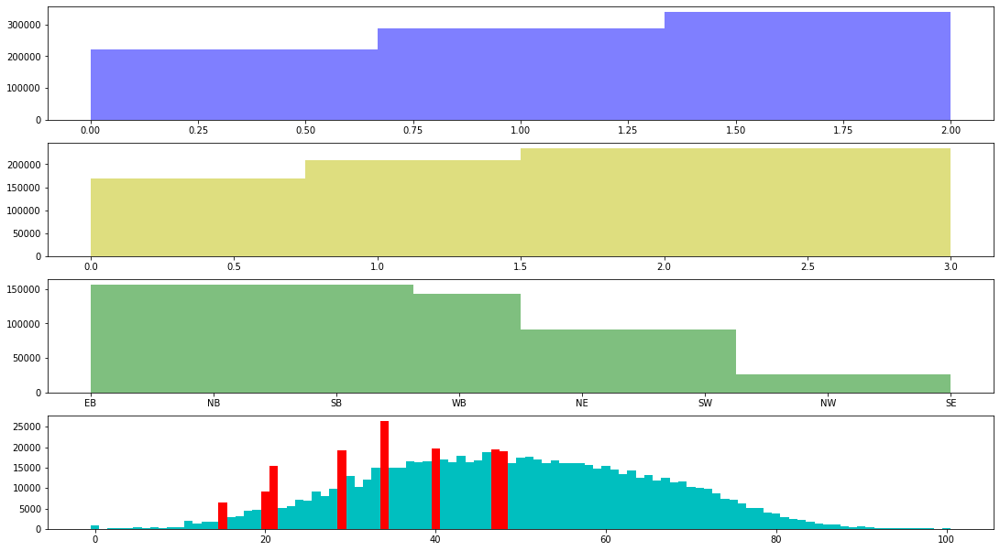

<Figure size 720x432 with 0 Axes>

In [123]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(4)
plt.figure(figsize=(10, 6))
color = ['blue','y','green']
fig.set_size_inches(18.5, 10.5)
for i in range(0,3):
  axs[i].hist(train_data.iloc[:,i+2], train_data.iloc[:,i+2].value_counts().shape[0], facecolor=color[i], alpha=0.5)

axs[3].bar(range(101), train_data.congestion.value_counts().sort_index(), width=1,
        color=['r' if con in [15, 20, 21, 29, 34,40,47,48] else 'c' for con in range(101)])

plt.show()


**"X" and "Y" are in good situation**

**"Direction" needs a little change, cause we have "skewed right" distribution**

**And for "Congestion" we can drop these red line for balance data**

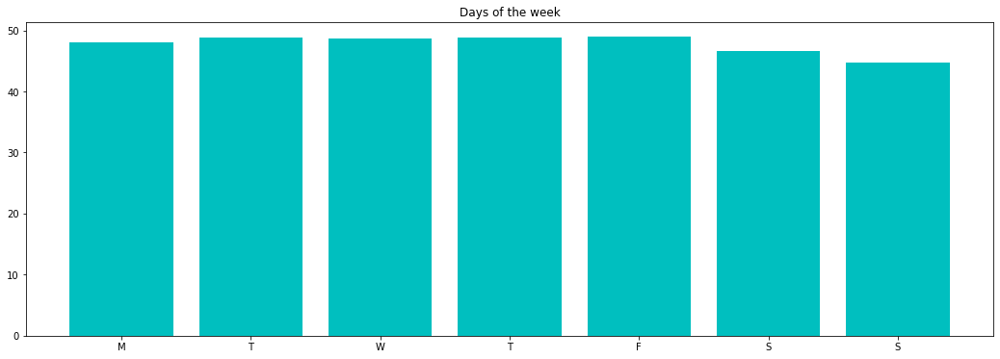

In [124]:
temp = train_data.groupby(train_data.time.dt.dayofweek).congestion.mean()
plt.figure(figsize=(18, 6))
plt.title('Days of the week')
plt.bar(temp.index, temp, color='c')
plt.xticks(ticks=temp.index, labels='MTWTFSS')
plt.show()

(40.0, 52.0)

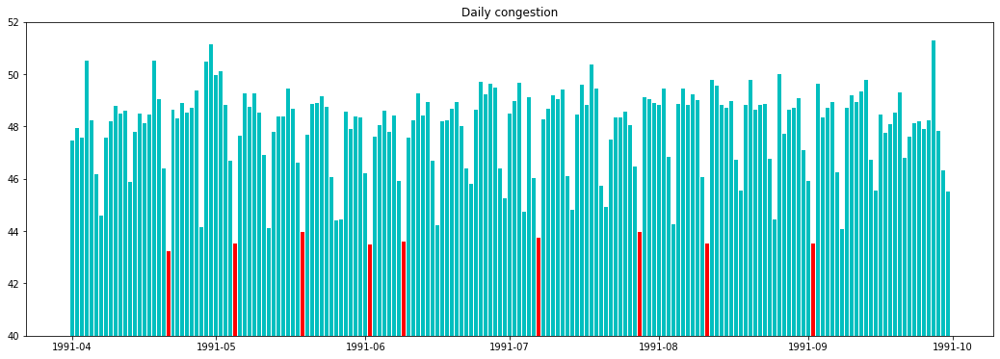

In [125]:
temp = train_data.groupby(train_data.time.dt.date).congestion.mean()
plt.figure(figsize=(18, 6))
plt.title('Daily congestion')
plt.bar(temp.index, temp, color=['r' if con <= 44 else 'c' for con in temp[range(temp.shape[0])]])
plt.ylim(40, 52)

*The red lines are times that we had just a little traffic, maybe these days were  holidays or other something else!*

**Maybe we should drop these days.**

# EDA (Plotly)

In [126]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [127]:
fig = make_subplots(rows=2, cols=2)
fig.add_trace(go.Histogram(x=train_data.iloc[:,2]),row=1,col=1)
fig.add_trace(go.Histogram(x=train_data.iloc[:,3]),row=2,col=1)
fig.add_trace(go.Histogram(x=train_data.iloc[:,4]),row=1,col=2)

fig.update_layout(height=600, width=800, title_text="Side By Side Subplots")
fig.show()

In [128]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=train_data.iloc[:,5],marker_color=['green' if con in [15, 20, 21, 29, 34,40,47] else 'indianred' for con in range(101)]))
fig.update_traces(marker_line_color='black',marker_line_width= 1.2,opacity=0.6)
fig.update_layout(font = dict(color='#d4c43b', family = 'monospace'),title = dict(text = 'Target(Congestion) distribution',x = 0.5, y =0.985,font = dict(size = 22)),
                  plot_bgcolor='#384543',
                  paper_bgcolor = '#384543',
                  showlegend = False)

In [129]:
train_daily = train_data.set_index('time').groupby([pd.Grouper(freq='D')])[['congestion']].mean()
train_daily = train_daily.reset_index()

fig = px.line(train_daily,
              x="time",
              y= 'congestion',
              color_discrete_sequence =['yellow'])

fig.update_xaxes(
        tickfont = dict(size=15, family = 'monospace', color ='#d4c43b'),
        tickmode = 'array',
        ticklen = 6,
        showline = False,
        showgrid = False,
        ticks = 'outside')


fig.update_yaxes(
        tickfont = dict(size=15, family = 'monospace', color ='#d4c43b'),
        tickmode = 'array',
        showline = False,
        showgrid = False,
        ticks = 'outside')

fig.update_traces(
                  marker_line_color='black',
                  marker_line_width= 1.2,
                  opacity=0.6,
                  )

fig.update_layout(font = dict(color='#d4c43b', family = 'monospace'),
                  title = dict(text = 'Daily-Congestion trend',
                               x = 0.5, y =0.985,
                               font = dict(size = 22
                               )),
                  plot_bgcolor='#384543',
                  paper_bgcolor = '#384543',
                  showlegend = False)

fig.show()

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


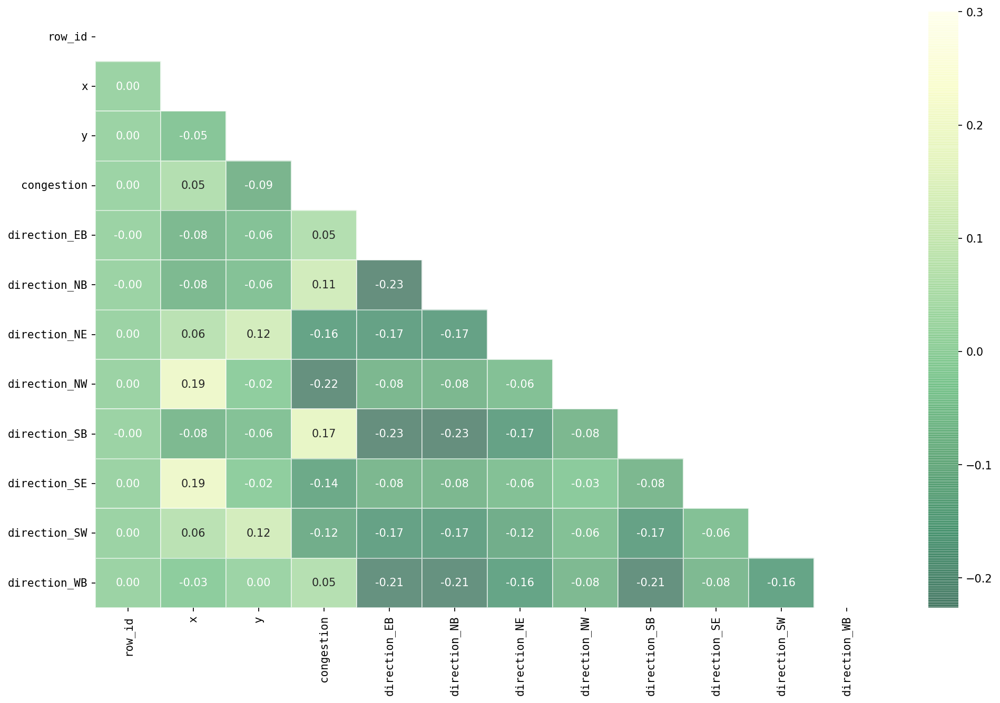

In [131]:
import seaborn as sns
data = pd.get_dummies(train_data, columns = ['direction'])
df1 = data.copy()

cols = df1.columns
plt.figure(figsize = (16, 10), dpi = 150)

corr = df1.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True


sns.heatmap(corr,
            mask = mask,
            cmap = 'YlGn_r',
            vmax=.3,
            annot = True,
            linewidths = 0.5,
            fmt = ".2f",
            alpha = 0.6)

hfont = {'fontname':'monospace'}
plt.xticks(**hfont)
plt.yticks(**hfont)



plt.show()

# Importnace feature Catboost

In [132]:
# Feature Engineering
for data in [train_data, test_data]:
    data['weekday'] = data.time.dt.weekday
    data['hour'] = data.time.dt.hour
    data['minute'] = data.time.dt.minute

In [133]:
!pip install catboost

In [134]:
from math import sin, cos, pi

sin_vals = {
    'NB': 0.0,
    'NE': sin(1 * pi/4),
    'EB': 1.0,
    'SE': sin(3 * pi/4),
    'SB': 0.0,
    'SW': sin(5 * pi/4),    
    'WB': -1.0,    
    'NW': sin(7 * pi/4),  
}

cos_vals = {
    'NB': 1.0,
    'NE': cos(1 * pi/4),
    'EB': 0.0,
    'SE': cos(3 * pi/4),
    'SB': -1.0,
    'SW': cos(5 * pi/4),    
    'WB': 0.0,    
    'NW': cos(7 * pi/4),  
}


train_data['sin'] = train_data['direction'].map(sin_vals)
train_data['cos'] = train_data['direction'].map(cos_vals)

test_data['sin'] = test_data['direction'].map(sin_vals)
test_data['cos'] = test_data['direction'].map(cos_vals)

encoded_vals = {
    'NB': 0,
    'NE': 1,
    'EB': 2,
    'SE': 3,
    'SB': 4,
    'SW': 5,
    'WB': 6, 
    'NW': 7,
}

train_data['direction'] = train_data['direction'].map(encoded_vals)

test_data['direction'] = test_data['direction'].map(encoded_vals)

train_data = train_data.drop('time', axis='columns')
test_data = test_data.drop('time', axis='columns')

X = train_data.copy()
y = X.pop('congestion')

num = int(len(X)*0.8)

# Potential time-dependent data, so no random splitting
X_train = X.iloc[:num, :]
X_test  = X.iloc[num:, :]

y_train = y.iloc[:num]
y_test  = y.iloc[num:]

import catboost as cb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
model = cb.CatBoostRegressor(loss_function= 'RMSE',
                             iterations = 200,
                             learning_rate=0.1, 
                             depth = 6)

model.fit(
    X_train, y_train,
    logging_level='Silent')  

pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 9.96
R2: 0.64


In [135]:
!pip install shap

In [136]:
importance = pd.Series(model.feature_importances_,
                       index = X_train.columns)

importance = importance.sort_values() 

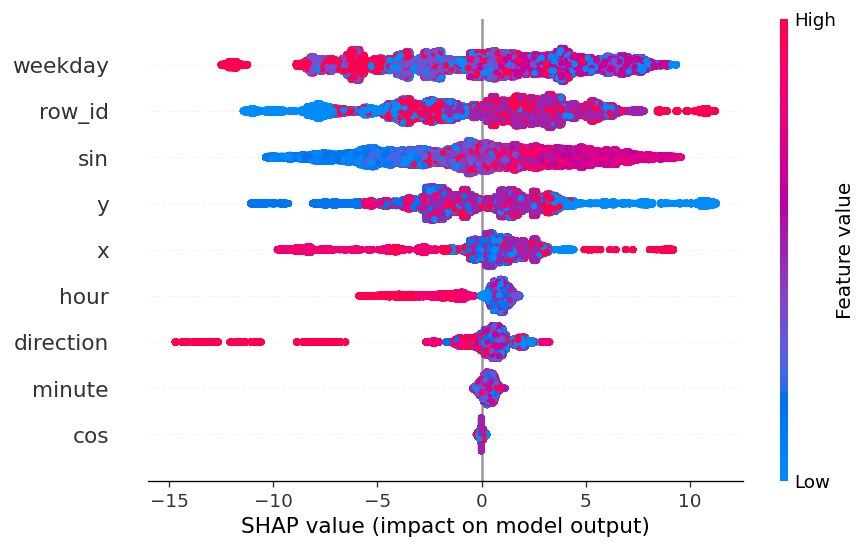

In [137]:
import shap
plt.figure(figsize = (10, 6), dpi = 120)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values,
                  X_test,
                  feature_names = importance.index)

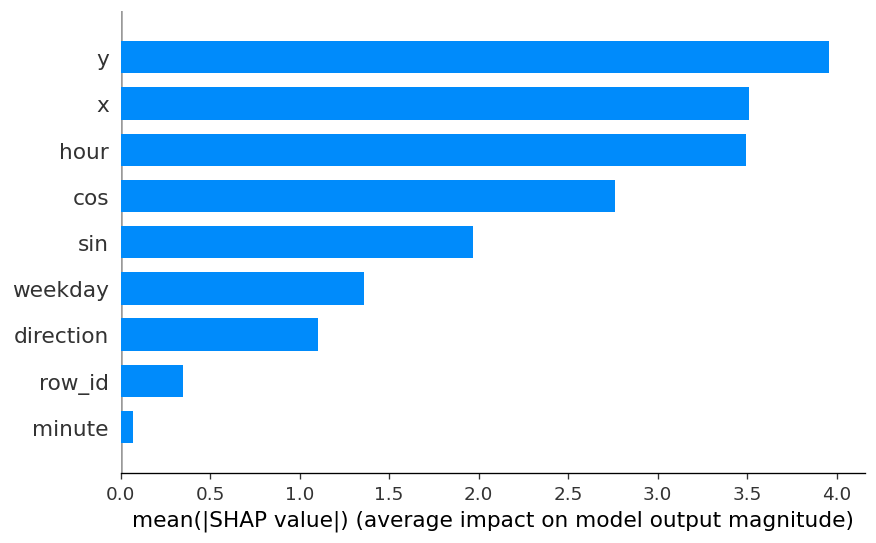

In [138]:
plt.figure(figsize = (8, 6), dpi = 120)
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns, plot_type="bar")